In [1]:
import sys
import xarray as xr
import numpy as np
import pandas as pd
import math
import glob
import yaml
import geopandas as gpd
import shapely.geometry
import cartopy
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar # different way to handle colorbar
import matplotlib.ticker as mticker
import cmocean.cm as cmo

# cartopy
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
import cartopy.feature as cfeature
# import dask

# import personal modules
# Path to modules
sys.path.append('../modules')
# Import my modules
from utils import roundPartial, select_months_ds
from plotter import draw_basemap, plot_terrain, plot_arscale_cbar
from colorline import colorline
from ARScale_stats import build_ar_stat_dataframe

# dask.config.set(**{'array.slicing.split_large_chunks': True})

ERROR 1: PROJ: proj_create_from_database: Open of /home/dnash/miniconda3/envs/SEAK-impacts/share/proj failed


In [2]:
path_to_data = '/expanse/nfs/cw3e/cwp140/' 
path_to_out  = '../out/'       # output files (numerical results, intermediate datafiles) -- read & write
path_to_figs = '../figs/'      # figures

In [3]:
## load watershed shapefile
## use geopandas to import the shapefile
fp = path_to_data + 'downloads/CO_HUC8/wbdhu8.shp'
polys = gpd.read_file(fp, crs="epsg:3857") # have to manually set the projection
## set a column to be the first two numbers 
## get first two numbers of HUC8
basin_number = polys['HUC8'].values
newlist = [x[:2] for x in basin_number]
polys['basin'] = newlist
polys = polys.dissolve(by='basin', aggfunc='sum')
polys['basin'] = [10, 11, 13, 14]
polys

,geometry,OBJECTID,TNMID,MetaSource,SourceData,SourceOrig,SourceFeat,LoadDate,GNIS_ID,AreaAcres,AreaSqKm,States,HUC8,Name,Shape_Leng,Shape_Area,basin
basin,,,,,,,,,,,,,,,,,
10,"POLYGON ((-105.86763 39.49419, -105.86738 39.4...",1459,{88F45F9F-080F-45EF-9653-CC111BD4D053}{E180B15...,0,0,0,0,2012-06-112012-06-112012-06-112012-06-112012-0...,0,29440289.37,119140.77,"COCOCOCO,KS,NECO,NECO,NECOCO,NE,WYCO,NECO,WYCO...",1019001110190013101900141025000110250005101900...,BijouBeaverPawneeArikareeFrenchmanLower South ...,146.538055,12.613489,10
11,"POLYGON ((-103.03204 36.72690, -103.03261 36.7...",984,{FD7D8C74-67B1-4679-A903-413DB9337C81}{2BD36A3...,0,0,0,0,2016-10-112012-06-112012-06-112012-06-112012-0...,0,23931227.67,96846.34,"COCOCO,NMCOCOCO,KS,NM,OKCOCO,NM,OKCOCO,NMCO,KS...",1102000211020006110800011102000811020012110400...,Upper ArkansasHuerfanoCanadian HeadwatersHorse...,102.935513,9.929023,11
13,"POLYGON ((-105.23421 37.03533, -105.23449 37.0...",343,{3C828B69-1041-4E06-98D9-546F1A0AB778}{72C226B...,0,0,0,0,2012-06-112012-06-112017-09-202012-06-112017-0...,0,8975607.30,36323.02,"CO,NMCO,NMCO,NMCOCO,NMCOCO",1301000513020102130100021301000413020101130100...,ConejosRio ChamaAlamosa-TrincheraSaguacheUpper...,33.428383,3.681679,13
14,"POLYGON ((-108.25677 36.48243, -108.25707 36.4...",1492,{75740F8C-AFFA-40B5-908E-4911BCB38D0B}{9CE10C9...,0,0,0,0,2012-06-112012-06-112012-06-112012-06-112012-0...,0,35639918.22,144229.79,"CO,NMAZ,CO,NMCOCOCOCO,WYCO,UTCOCO,UTCO,UTCO,WY...",1408010714080105140200051402000214050002140401...,MancosMiddle San JuanLower GunnisonUpper Gunni...,144.552341,15.010810,14


In [4]:
start_mon = 1
end_mon = 12

## load PRISM watershed precip dataset
fname = path_to_data + 'preprocessed/PRISM/PRISM_HUC8_CO_sp.nc'
PRISM = xr.open_dataset(fname)
## get just Nov - April
PRISM = select_months_ds(PRISM, start_mon, end_mon, 'date')

HUC8_lst = PRISM.HUC8.values ## get list of HUC8 IDs

## a quick function that assigns each watershed a basin value 
## based on the first 2 numbers of the HUC8 identifier

basin_lst = []
for i, HUC8_ID in enumerate(HUC8_lst):
    HUC2 = HUC8_ID[:2]
    if HUC2 == '14':
        basin = 'Upper Colorado'
    elif HUC2 == '13':
        basin = 'Rio Grande'
    elif HUC2 == '11':
        basin = 'Arkansas'
    elif HUC2 == '10':
        basin = 'Missouri'
   
    basin_lst.append(basin)
    
ds_lst = []
for i, HUC8_ID in enumerate(HUC8_lst):
    fname = path_to_data +'preprocessed/ERA5_trajectories/combined_extreme_AR/PRISM_HUC8_{0}.nc'.format(HUC8_ID)
    ds = xr.open_dataset(fname)
    ds_lst.append(ds)
    
## concat ds_lst along HUC8 index
ds = xr.concat(ds_lst, pd.Index(HUC8_lst, name="HUC8"))
## add the basin name as a coord
ds = ds.assign_coords({'basin': ("HUC8", basin_lst)})
ds

<xarray.Dataset>
Dimensions:             (index: 72, start_date: 1641, HUC8: 92)
Coordinates:
  * index               (index) int64 0 1 2 3 4 5 6 7 ... 65 66 67 68 69 70 71
  * start_date          (start_date) datetime64[ns] 2000-01-11 ... 2023-12-26
    time                (HUC8, start_date, index) datetime64[ns] NaT NaT ... NaT
    lon                 (HUC8, start_date, index) float64 nan nan ... nan nan
    lat                 (HUC8, start_date, index) float64 nan nan ... nan nan
  * HUC8                (HUC8) object '14080107' '14080105' ... '10250013'
    basin               (HUC8) <U14 'Upper Colorado' ... 'Missouri'
Data variables: (12/20)
    level               (HUC8, start_date, index) float64 nan nan ... nan nan
    q                   (HUC8, start_date, index) float64 nan nan ... nan nan
    u                   (HUC8, start_date, index) float64 nan nan ... nan nan
    v                   (HUC8, start_date, index) float64 nan nan ... nan nan
    w                   (HUC8, start_date, index) float64 nan nan ... nan nan
    IVT                 (HUC8, start_date, index) float64 nan nan ... nan nan
    ...                  ...
    ar_strict           (HUC8, start_date) float64 nan nan nan ... nan nan nan
    tARget_strict       (HUC8, start_date) float64 nan nan nan ... nan nan nan
    coastal_IVT_strict  (HUC8, start_date) float64 nan nan nan ... nan nan nan
    time_match          (HUC8, start_date) object nan nan nan ... nan nan nan
    lat_match           (HUC8, start_date) float64 nan nan nan ... nan nan nan
    lon_match           (HUC8, start_date) float64 nan nan nan ... nan nan nan

In [5]:
ssn_lst = ['NDJFMA', 'MJJASO']
basin_lst = ['Upper Colorado', 'Rio Grande', 'Missouri', 'Arkansas']

df_lst = []
for i, ssn in enumerate(ssn_lst):
    for j, basin in enumerate(basin_lst):
        print(ssn, basin)
        s = build_ar_stat_dataframe(ds, PRISM, basin, ssn)
        df = s.create_dataframe()
        df_lst.append(df)

df = pd.concat(df_lst, axis=0)
df

NDJFMA Upper Colorado
NDJFMA Rio Grande
NDJFMA Missouri
NDJFMA Arkansas
MJJASO Upper Colorado
MJJASO Rio Grande
MJJASO Missouri
MJJASO Arkansas


,Basin Name,Season,nsubbasins,Total Trajectories,AR events,AR1,AR2,AR3,AR4,AR5
0,Upper Colorado,NDJFMA,33,2240,1206,705,360,122,16,3
0,Rio Grande,NDJFMA,7,446,241,135,71,28,7,0
0,Missouri,NDJFMA,31,1109,152,90,49,11,1,1
0,Arkansas,NDJFMA,21,540,42,33,7,1,1,0
0,Upper Colorado,MJJASO,33,2141,655,481,132,22,13,7
0,Rio Grande,MJJASO,7,402,92,63,25,4,0,0
0,Missouri,MJJASO,31,2802,201,134,57,9,1,0
0,Arkansas,MJJASO,21,1813,245,161,52,22,2,8


In [ ]:
df.sum()

In [6]:
ds_NDJFMA = select_months_ds(ds, 11, 4, 'start_date')
ds_MJJASO = select_months_ds(ds, 5, 10, 'start_date')

ds_lst = [ds_NDJFMA, ds_MJJASO]

ds_DJF = select_months_ds(ds, 12, 2, 'start_date')
ds_MAM = select_months_ds(ds, 3, 5, 'start_date')
ds_JJA = select_months_ds(ds, 6, 8, 'start_date')
ds_SON = select_months_ds(ds, 9, 11, 'start_date')

ds_lst2 = [ds_DJF, ds_MAM, ds_JJA, ds_SON]

In [ ]:
ssn_lst = ['NDJFMA', 'MJJASO']
titlestring = [['(a)', '(b)', '(c)', '(d)'],
               ['(e)', '(f)', '(g)', '(h)']]

for i, ssn in enumerate(ssn_lst):
    for j, basin in enumerate(basin_lst):
        print(ssn, basin)
        print(j, i)
        print(titlestring[i][j])

In [7]:
# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.PlateCarree() ## the projection you want your map displayed in

ext = [-140., -90., 20, 50]

# Set tick/grid locations
tx = 10
ty = 5
dx = np.arange(ext[0],ext[1]+tx,tx)
dy = np.arange(ext[2],ext[3]+ty,ty)



In [ ]:
nrows = 6
ncols = 2

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 1, 1, 0.05, 0.05], width_ratios = [1, 1], wspace=0.01, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(7.75, 10.))
fig.dpi = 600
fname = path_to_figs + 'ARScale_basin_WY'
fmt = 'png'

############################
### PLOT AR SCALE VALUES ###
############################
plt_lbl = ['NDJFMA', 'MJJASO']
colors = ['#F5F0E6', '#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']
ssn_lst = ['NDJFMA', 'MJJASO']
basin_id = [14, 13, 10, 11]

for i, ssn in enumerate(ssn_lst):
    for j, basin_name in enumerate(basin_lst):
        if i == 0:
            llats = True
        elif i == 1:
            llats = False
        if j == 3:
            blons = True
        else: 
            blons = False
        print(ssn, basin_name)
        ax = fig.add_subplot(gs[j, i], projection=mapcrs)
        ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=llats, right_lats=False, bottom_lons=blons)
        ax.set_extent(ext, datacrs)
        ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
        
        if j == 0: # add column label to top row only
            ax.set_title(ssn, loc='left', fontsize=14)
        
        if i == 0: # add row labels to the far left plot
            ax.text(-0.16, 0.5, basin_name, va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=13,
                transform=ax.transAxes)
    
        ds = ds_lst[i].where(ds_lst[i].basin==basin_name, drop=True)
        ## Loop through AR scale values
        for k in range(1, 7):
            try:
                AR = ds.where(ds.ar_scale == k, drop=True)
                for l, HUC8 in enumerate(AR.HUC8.values):
                    tmp = AR.sel(HUC8=HUC8)
                    tmp = tmp.where(tmp.ar_scale == k, drop=True)
                    nevents = len(tmp.start_date)
                    ## LOOP THROUGH TRAJECTORIES
                    for m in range(nevents):
                        data =tmp.isel(start_date=m)
                        y_lst = data.lat.values
                        x_lst = data.lon.values
                        ax.plot(x_lst, y_lst, c=colors[k-1], transform=datacrs, alpha=0.2)
                        cf = ax.scatter(x_lst, y_lst, c=colors[k-1], marker='.', transform=datacrs, alpha=0.7, s=6)
            except IndexError:
                pass

        ## add in four basins
        plot_poly = polys[(polys.basin == basin_id[j])]
        plot_poly.crs = 'epsg:3857'
        print(plot_poly.crs)
        plot_poly.plot(ax=ax, edgecolor='black', color='None', zorder=200)

        ax.text(0.03, 0.96, titlestring[i][j], ha='left', va='top', transform=ax.transAxes, fontsize=11., backgroundcolor='white', zorder=101)


# # Add color bar
cbax = plt.subplot(gs[-1,:]) # colorbar axis
plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()

In [ ]:
nrows = 4
ncols = 2

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 0.05, 0.05], width_ratios = [1, 1], wspace=0.01, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(8.0, 5.5))
fig.dpi = 600
fname = path_to_figs + 'ARScale_basin_WY_twobasin'
fmt = 'png'

############################
### PLOT AR SCALE VALUES ###
############################
plt_lbl = ['NDJFMA', 'MJJASO']
colors = ['#F5F0E6', '#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']
left_lats = [True, False]
bottom_lons = [False, True]
ssn_lst = ['NDJFMA', 'MJJASO']
basin_lst = ['Upper Colorado', 'Missouri']
basin_id = [14, 10]

for i, ssn in enumerate(ssn_lst):
    for j, basin_name in enumerate(basin_lst):
        print(ssn, basin_name)
        ax = fig.add_subplot(gs[i, j], projection=mapcrs)
        ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=left_lats[j], right_lats=False, bottom_lons=bottom_lons[i])
        ax.set_extent(ext, datacrs)
        ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
        
        if i == 0: # add column label to top row only
            ax.set_title(basin_name, loc='left', fontsize=14)
        
        if j == 0: # add row labels to the far left plot
            ax.text(-0.16, 0.5, ssn_lst[i], va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=13,
                transform=ax.transAxes)
    
        ds = ds_lst[i].where(ds_lst[i].basin==basin_name, drop=True)
        ## Loop through AR scale values
        for k in range(1, 7):
            try:
                AR = ds.where(ds.ar_scale == k, drop=True)
                for l, HUC8 in enumerate(AR.HUC8.values):
                    tmp = AR.sel(HUC8=HUC8)
                    tmp = tmp.where(tmp.ar_scale == k, drop=True)
                    nevents = len(tmp.start_date)
                    ## LOOP THROUGH TRAJECTORIES
                    for m in range(nevents):
                        data =tmp.isel(start_date=m)
                        y_lst = data.lat.values
                        x_lst = data.lon.values
                        ax.plot(x_lst, y_lst, c=colors[k-1], transform=datacrs, alpha=0.2)
                        cf = ax.scatter(x_lst, y_lst, c=colors[k-1], marker='.', transform=datacrs, alpha=0.7, s=6)
            except IndexError:
                pass

        ## add in four basins
        plot_poly = polys[(polys.basin == basin_id[j])]
        plot_poly.crs = 'epsg:3857'
        print(plot_poly.crs)
        plot_poly.plot(ax=ax, edgecolor='black', color='None', zorder=200)

# # Add color bar
cbax = plt.subplot(gs[-1,:]) # colorbar axis
plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()

In [ ]:
nrows = 6
ncols = 4

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 1, 1, 0.05, 0.05], width_ratios = [1, 1, 1, 1], wspace=0.01, hspace=0.05)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(16.0, 10.0))
fig.dpi = 600
fname = path_to_figs + 'ARScale_basin_SSN'
fmt = 'png'

############################
### PLOT AR SCALE VALUES ###
############################
plt_lbl = ['DJF', 'MAM', 'JJA', 'SON']
colors = ['#F5F0E6', '#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']
left_lats = [True, False, False, False]
bottom_lons = [False, False, False, True]
ssn_lst = ['DJF', 'MAM', 'JJA', 'SON']
basin_lst = ['Upper Colorado', 'Rio Grande', 'Missouri', 'Arkansas']
basin_id = [14, 13, 10, 11]
titlestring = [['(a)', '(b)', '(c)', '(d)'],
               ['(e)', '(f)', '(g)', '(h)'],
               ['(i)', '(j)', '(k)', '(l)'],
               ['(m)', '(n)', '(o)', '(p)']]

for i, ssn in enumerate(ssn_lst):
    for j, basin_name in enumerate(basin_lst):
        print(ssn, basin_name)
        ax = fig.add_subplot(gs[i, j], projection=mapcrs)
        ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=left_lats[j], right_lats=False, bottom_lons=bottom_lons[i])
        ax.set_extent(ext, datacrs)
        ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
        
        if i == 0: # add column label to top row only
            ax.set_title(basin_name, loc='left', fontsize=14)
        
        if j == 0: # add row labels to the far left plot
            ax.text(-0.16, 0.5, ssn_lst[i], va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=13,
                transform=ax.transAxes)
    
        ds = ds_lst2[i].where(ds_lst2[i].basin==basin_name, drop=True)
        ## Loop through AR scale values
        for k in range(1, 7):
            try:
                AR = ds.where(ds.ar_scale == k, drop=True)
                for l, HUC8 in enumerate(AR.HUC8.values):
                    tmp = AR.sel(HUC8=HUC8)
                    tmp = tmp.where(tmp.ar_scale == k, drop=True)
                    nevents = len(tmp.start_date)
                    ## LOOP THROUGH TRAJECTORIES
                    for m in range(nevents):
                        data =tmp.isel(start_date=m)
                        y_lst = data.lat.values
                        x_lst = data.lon.values
                        ax.plot(x_lst, y_lst, c=colors[k-1], transform=datacrs, alpha=0.2)
                        cf = ax.scatter(x_lst, y_lst, c=colors[k-1], marker='.', transform=datacrs, alpha=0.7, s=6)
            except IndexError:
                pass

        ## add in four basins
        plot_poly = polys[(polys.basin == basin_id[j])]
        plot_poly.crs = 'epsg:3857'
        print(plot_poly.crs)
        plot_poly.plot(ax=ax, edgecolor='black', color='None', zorder=99)

        ax.text(0.03, 0.96, titlestring[i][j], ha='left', va='top', transform=ax.transAxes, 
                fontsize=11., backgroundcolor='white', zorder=101)        
# # Add color bar
cbax = plt.subplot(gs[-1,:]) # colorbar axis
plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()

NDJFMA


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

epsg:3857
MJJASO


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

epsg:3857


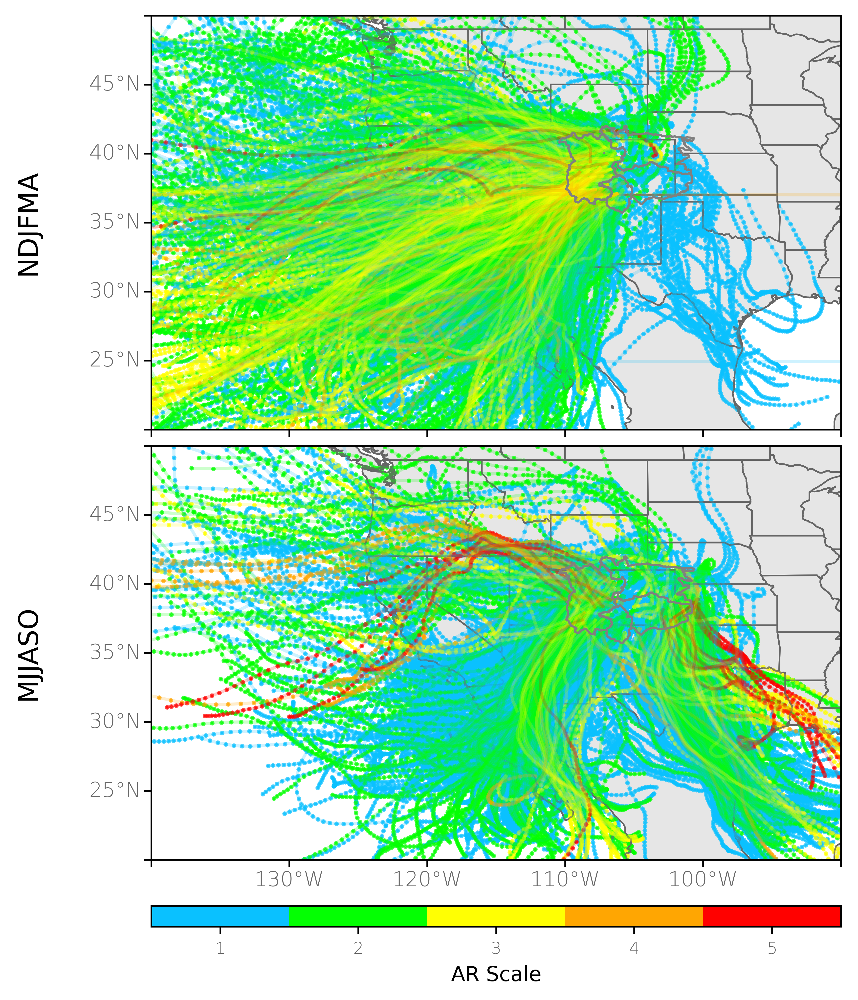

In [8]:
nrows = 4
ncols = 1

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 0.05, 0.05], width_ratios = [1], wspace=0.01, hspace=0.05)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(6., 8.))
fig.dpi = 600
fname = path_to_figs + 'ARScale_all_WY'
fmt = 'png'

############################
### PLOT AR SCALE VALUES ###
############################
plt_lbl = ['NDJFMA', 'MJJASO']
colors = ['#F5F0E6', '#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']
left_lats = [True, False, False, False]
bottom_lons = [False, True]
ssn_lst = ['NDJFMA', 'MJJASO']
basin_lst = ['Upper Colorado', 'Rio Grande', 'Missouri', 'Arkansas']
basin_id = [14, 13, 10, 11]

for i, ssn in enumerate(ssn_lst):
    print(ssn)
    ax = fig.add_subplot(gs[i, 0], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=True, right_lats=False, bottom_lons=bottom_lons[i])
    ax.set_extent(ext, datacrs)
    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)

    # add row labels to the far left plot
    ax.text(-0.16, 0.5, ssn_lst[i], va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor', fontsize=13,
        transform=ax.transAxes)

    ds = ds_lst[i]
    ## Loop through AR scale values
    for k in range(1, 7):
        try:
            AR = ds.where(ds.ar_scale == k, drop=True)
            for l, HUC8 in enumerate(AR.HUC8.values):
                tmp = AR.sel(HUC8=HUC8)
                tmp = tmp.where(tmp.ar_scale == k, drop=True)
                nevents = len(tmp.start_date)
                ## LOOP THROUGH TRAJECTORIES
                for m in range(nevents):
                    data =tmp.isel(start_date=m)
                    y_lst = data.lat.values
                    x_lst = data.lon.values
                    ax.plot(x_lst, y_lst, c=colors[k-1], transform=datacrs, alpha=0.2)
                    cf = ax.scatter(x_lst, y_lst, c=colors[k-1], marker='.', transform=datacrs, alpha=0.7, s=6)
        except IndexError:
            pass


    ## add in four basins
    plot_poly = polys
    plot_poly.crs = 'epsg:3857'
    print(plot_poly.crs)
    plot_poly.plot(ax=ax, edgecolor='gray', color='None', zorder=99)

# # Add color bar
cbax = plt.subplot(gs[-1,:]) # colorbar axis
plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()